## Programming Assignment 4: Multi Camera Geometry
CAP 4410
This code is build using code snippets from the Dr. Sudeep Sarkar's class materials. All code can be found this github page:
https://github.com/SudeepSarkar/Undergraduate-Computer-Vision

**Author: Param Chokshi, U70722122**

**Instructions:**   


*   In the next cell mount your google drive, and set the path of the Wildtrack dataset
*   To run all the tasks together, just select the run all cells option from the runtime menu or simply press ctrl + F9
*   The tasks can also be executed seperately. For that run each cell in order



# Mount google drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
#Set the path to WILDTRACK dataset
path = '/content/drive/MyDrive/Colab Notebooks/data/Wildtrack'

# General Imports

In [5]:
import numpy as np
import torch

import matplotlib.pyplot as plt
import scipy.ndimage as scimage
from skimage.transform import warp
import torch.nn as nn
from skimage import io

!pip install opencv-contrib-python==4.4.0.44
import cv2
print (cv2 .__version__)

np.set_printoptions(precision=4, suppress=True)
torch.set_printoptions(precision=4, sci_mode=False)

     |████████████████████████████████| 55.7 MB 1.2 MB/s 
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30
4.4.0


# Code: `compute_essential_fundamental_matrices` from calibrated cameras

In [6]:
# Compute essential and fundamental matrices from R, T, K matrices that are returned from calibration
def compute_essential_fundamental_matrices (R_left, T_left, K_left, R_right, T_right, K_right) :
    ''' Given the calibrations of each of the cameras with respect to the world, it return essential (E)
    and fundamental (F) matrices. '''
    R_lr =  R_right @ np.transpose(R_left) # rotation matrix to align a pt in left image to right image
    T_r =  T_right - R_lr @ T_left   # translation vector to the left camera from the right camera, with respect to the right camera 

    '''Epipolar constraint matrix (Essential matrix)'''
    E = np.zeros((3,3))
    E[:,0] = np.cross(T_r, R_lr[:,0]) # essential matrix
    E[:,1] = np.cross(T_r, R_lr[:,1])
    E[:,2] = np.cross(T_r, R_lr[:,2])

    ''' Fundamental matrices -- to express in terms of array coordinates '''
    K_left_inv = np.linalg.inv(K_left)
    K_right_inv = np.linalg.inv(K_right)
    F = np.transpose(K_right_inv) @ E @ K_left_inv  # Fundamental matrix -- includes intrinsic parameters
    return (E, F, R_lr, T_r)

## Code: `epipolar_lines`

In [7]:
# Code to compute epipolar lines corresponding to a given point in the left image.

def epipolar_lines (F, point_left, image_left_size, image_right_size) :
    '''
    F is 3 by 3 fundamental matrix
    point_left is 2 by 1 vector of point in the left image
    image_left_size, image_right_size are the sizes of the two images
    It returns pairs of corresponding epiolar lines 
    (i) epipolar line passing through the point in the left image and
    (ii) epipolar line in the right image corresponding to the point in the left image.
    '''

    pts = np.row_stack ((point_left, [1])) # homogenous represention

    line_right = F @ pts # homogenous coordinates of the epipolar line, line_right is 3 by 1

    # The following code computes a set of points on the epiolar line in the right image that can be ploted
    # Coordinates of the epipolar line on right image for the point p_right
    x_right = np.arange(0, image_right_size[1]) # uniformly spread x coordinates
    y_right = (-line_right[0]*x_right - line_right[2])/line_right[1] # corresponding y-coordinates
    
    # select only the part of the line that falls within the image
    x_right = x_right[(y_right[:] > 0),]; 
    y_right = y_right[(y_right[:] > 0),];
    x_right = x_right[(y_right[:] < image_right_size[0]),] 
    y_right = y_right[(y_right[:] < image_right_size[0]),]
    
    # The following code computes a set of points on the epiolar line in the left image that can be ploted 
    if (x_right.any()) : # if the right epiolar line is inside the image boundary
        p_right = np.array([x_right[0], y_right[0], 1]) # pick a point on the line

        line_left = p_right @ F

        # Coordinates of the epipolar line on left image for the point p_right
        x_left = np.arange(0, image_left_size[1])
        y_left = (-line_left[0]*x_left - line_left[2])/line_left[1]
        # select only the part of the line that falls within the image
        x_left = x_left[(y_left[:] > 0),]; 
        y_left = y_left[(y_left[:] > 0),];
        x_left = x_left[(y_left[:] < image_left_size[0]),] 
        y_left = y_left[(y_left[:] < image_left_size[0]),]
    
    if (x_right.any()) :
        if (x_left.any()) :
            return(x_left, y_left, x_right, y_right)
    return(np.array([]), np.array([]), np.array([]), np.array([]))       

## Code: Read calibration data from WILDTRACK dataset

In [8]:
!pip install xmltodict
import xmltodict
from scipy.spatial.transform import Rotation 

In [9]:
# Read calibration data of the WILDTRACK dataset. There are seven cameras arranged around an outdoor space.

calib_dir = path + '/calibrations/'
extrinsic_calibration_files = ['extrinsic/extr_CVLab1.xml', 'extrinsic/extr_CVLab2.xml', 'extrinsic/extr_CVLab3.xml',
                               'extrinsic/extr_CVLab4.xml', 'extrinsic/extr_IDIAP1.xml', 'extrinsic/extr_IDIAP2.xml',
                               'extrinsic/extr_IDIAP3.xml']
intrinsic_calibration_files = ['intrinsic_zero/intr_CVLab1.xml', 'intrinsic_zero/intr_CVLab2.xml', 'intrinsic_zero/intr_CVLab3.xml',
                               'intrinsic_zero/intr_CVLab4.xml', 'intrinsic_zero/intr_IDIAP1.xml', 'intrinsic_zero/intr_IDIAP2.xml',
                               'intrinsic_zero/intr_IDIAP3.xml']
R_list = [] # list of rotations, w.r.t individual cameras
T_list = [] # list of translations, w.r.t individual cameras
K_list = [] # list of intrinsic parameters for individual cameras
c_list = [] # list of camera locations w.r.t world coordinates


def readCalibration():
  for i in range(7) :
    #read extrinsic parameters
    extr_file = calib_dir + extrinsic_calibration_files[i]
    xml_data = open(extr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    #print('\nExtrinsic (camera {}) xmlDict:\n'.format(i), xmlDict)
    rot_rodriges = np.fromstring(xmlDict['opencv_storage']['rvec'], sep=' ') # rotation information stored in Rodriges format \theta * (axis)
    R = Rotation.from_rotvec(rot_rodriges).as_matrix()
    R_list.append(R)
    T = np.fromstring(xmlDict['opencv_storage']['tvec'], sep=' ')
    T_list.append(T)
    c_list.append(-np.transpose(R_list[i]) @ T_list[i][:,None]) # location of the camera coordinates w.r.t. world coordinates
   
    # read intrinsic parameters
    intr_file = calib_dir + intrinsic_calibration_files[i]
    xml_data = open(intr_file, 'r').read()  # Read data
    xmlDict = xmltodict.parse(xml_data)  # Parse XML
    #print('Intrinsic xmlDict:\n', xmlDict)
    K_mat = np.fromstring(xmlDict['opencv_storage']['camera_matrix']['data'], sep=' ').reshape(3,3)
    K_list.append(K_mat)

readCalibration()

# Helper functions

In [10]:
def world_to_image (p, K, R, T) :
    # p is a 3D point, return the 2D image location
    x = K @ (R @ p + T)
    x /= x[2,:]
    return(x[0:2,:])

In [11]:
def inside_image (image, p) :
    # p is 2 by N set of points, return N, size array indicating which points are inside the image.
    insideP = (p[1,:] < image.shape[0]) * (p[0,:] < image.shape[1]) * (p[0,:] > 0) * (p[1,:] > 0)
    return(insideP)

## Task 1

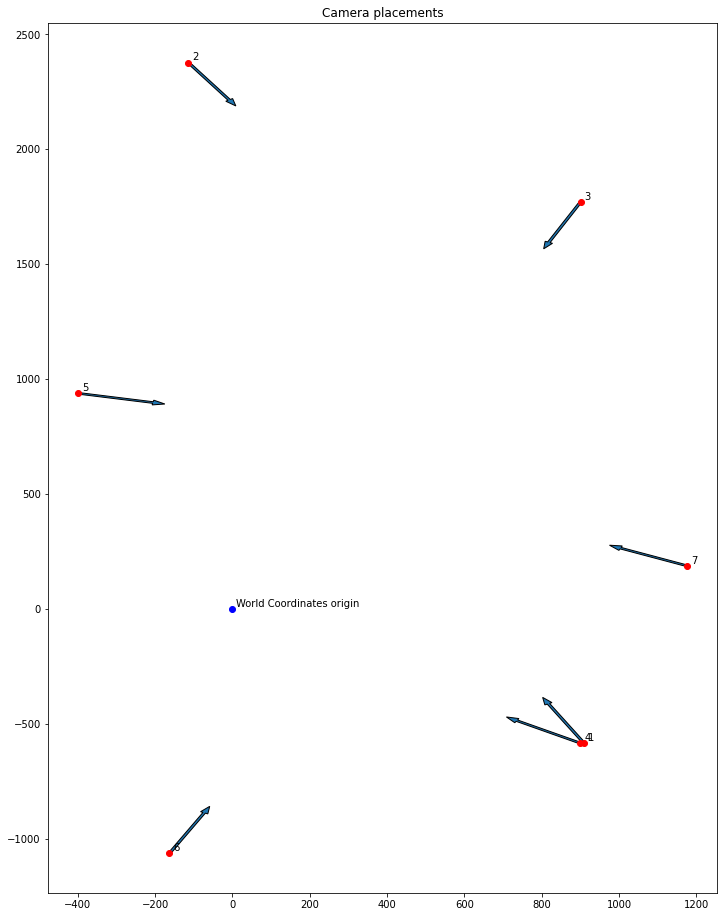

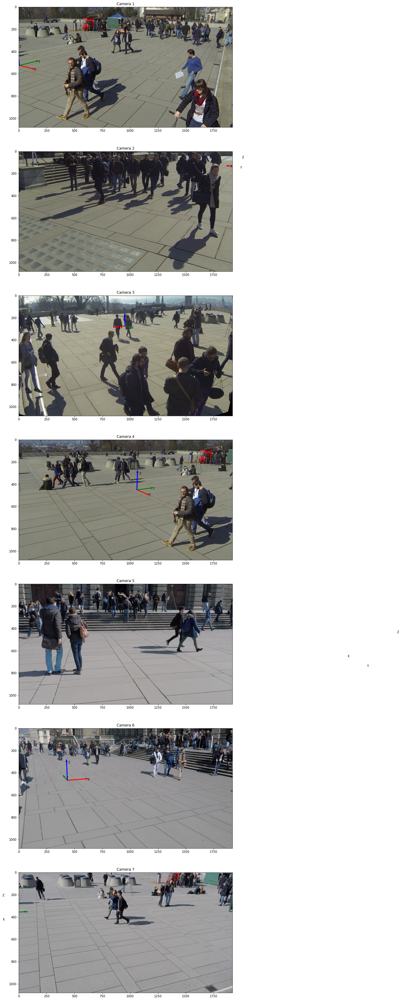

In [12]:
def plotCameras():
  plt.figure(figsize=(12, 16))
  # for all cameras
  for i in range(7) :

      z = np.array([0., 0., 200.]) # point along the z-axis
      view = (np.transpose(R_list[i])@z[:,None])  + c_list[i] #location of the point (0,0,200) w.r.t. world coordinates

      plt.title('Camera placements')
      plt.plot(c_list[i][0], c_list[i][1], 'ro') # plot camera center
  
      plt.arrow(c_list[i][0][0], c_list[i][1][0], view[0][0] - c_list[i][0][0], view[1][0] - c_list[i][1][0], width=7) # plot view arrows
      plt.text(c_list[i][0]+10, c_list[i][1]+10, '{}'.format(i+1))

  #plot origin
  plt.plot(0,0, 'bo')
  plt.text(10,10, "World Coordinates origin")   

def placeWorldCoordinateAxes():
  fig, ax = plt.subplots(7, 1)
  fig.set_size_inches(20, 60)
  images = []
  for i in range(7) :
      file_name = path + '/C{:1d}/00000015.png'.format(i+1)
      image = io.imread(file_name)
      images.append(image)
      ax[i].imshow(images[i], 'gray')
      
      origin = world_to_image (np.array([[0],[0],[0]]), K_list[i], R_list[i], T_list[i][:,None]) # origin
      x = world_to_image (np.array([[100],[0],[0]]), K_list[i], R_list[i], T_list[i][:,None]) # point along x-axis
      y = world_to_image (np.array([[0],[100],[0]]), K_list[i], R_list[i], T_list[i][:,None]) # point along y-axis
      z = world_to_image (np.array([[0],[0],[100]]), K_list[i], R_list[i], T_list[i][:,None]) # point along z-axis

      #plot rays from the orgin to the points along x, y, and z axes
      ax[i].set_title('Camera {}'.format(i+1))
      ax[i].arrow(origin[0][0], origin[1][0], x[0][0] - origin[0][0], x[1][0] - origin[1][0], color ='r',width=5, )
      ax[i].text(x[0][0]+15, x[1][0]+15, '{}'.format('X'))
      ax[i].arrow(origin[0][0], origin[1][0], y[0][0] - origin[0][0], y[1][0] - origin[1][0], width=5, color = 'g')
      ax[i].text(y[0][0]+15, y[1][0]+15, '{}'.format('Y'))
      ax[i].arrow(origin[0][0], origin[1][0], z[0][0] - origin[0][0], z[1][0] - origin[1][0], width=5, color = 'b')
      ax[i].text(z[0][0]+15, z[1][0]+15, '{}'.format('Z'))


def task1():
  plotCameras()
  placeWorldCoordinateAxes()

#executes task 1
task1()




## Code: Read Wildtrack images

## Task 2

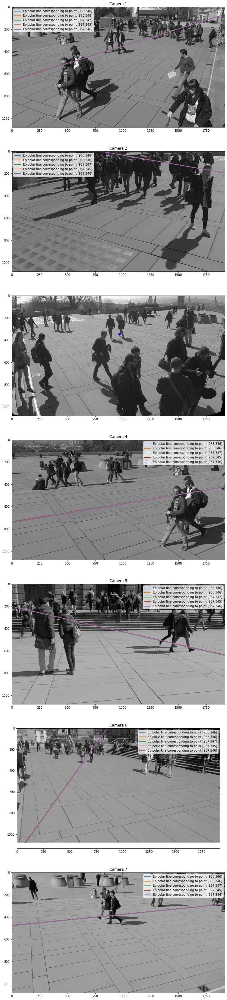

In [13]:
def task2(cameraNum, pixelX, pixelY):

  ''' Read in the images '''
  base_image = io.imread(path + '/C{:1d}/00000015.png'.format(cameraNum))
  base_image = cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB)
  base_image = cv2.cvtColor(base_image, cv2.COLOR_BGR2GRAY)
  fig, ax = plt.subplots(7, 1)
  fig.set_size_inches(20, 60)
  
  for i in range(7) :
      if i == cameraNum-1:
        continue
      file_name = path + '/C{:1d}/00000015.png'.format(i+1)
      image = io.imread(file_name)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

      # calculate the fundamental matrix and get the intrinsic parameters
      E, F, R, T = compute_essential_fundamental_matrices (R_list[cameraNum-1], T_list[cameraNum-1], K_list[cameraNum-1], R_list[i], T_list[i], K_list[i])
      K_left = K_list[cameraNum-1]
      K_right = K_list[i]

      #----------------------------------Display-------------------------------------------------------
     
      
      #consider some points in the + - 1 pixel region while plotting
      pts = [np.array([pixelX+1, pixelY]),np.array([pixelX-1, pixelY]),np.array([pixelX, pixelY+1]),np.array([pixelX, pixelY-1]), np.array([pixelX, pixelY])]
      p1 = np.array([pixelX, pixelY])
      ax[i].set_title('Camera {}'.format(i+1))
      ax[cameraNum-1].imshow(base_image, 'gray')
      ax[cameraNum-1].plot(p1[0], p1[1], 'bo')
      ax[i].imshow(image, 'gray')
      
      for p1 in pts:
        x_1, y_1, x_2, y_2 = epipolar_lines (F, p1[:,None], base_image.shape, image.shape)
        ax[i].plot(x_2, y_2, linewidth=2, label = 'Epipolar line corresponding to point {}'.format(p1));
      ax[i].legend()


task2(3, 967,346)


## Task 3

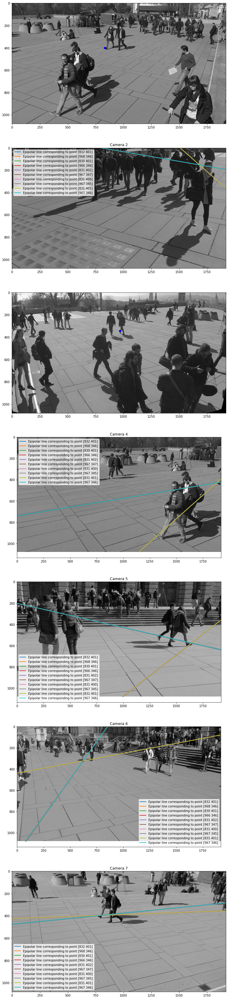

In [14]:
def task3(cameraNum1, pixelX1, pixelY1, cameraNum2, pixelX2, pixelY2):
  ''' Read in the images '''
  base_image1 = io.imread(path + '/C{:1d}/00000015.png'.format(cameraNum1))
  base_image1 = cv2.cvtColor(base_image1, cv2.COLOR_BGR2RGB)
  base_image1 = cv2.cvtColor(base_image1, cv2.COLOR_BGR2GRAY)
  base_image2 = io.imread(path + '/C{:1d}/00000015.png'.format(cameraNum2))
  base_image2 = cv2.cvtColor(base_image2, cv2.COLOR_BGR2RGB)
  base_image2 = cv2.cvtColor(base_image2, cv2.COLOR_BGR2GRAY)

  fig, ax = plt.subplots(7, 1)
  fig.set_size_inches(20, 60)
  for i in range(7) :
      if i in [cameraNum1-1, cameraNum2-1]:
        continue
      file_name = path + '/C{:1d}/00000015.png'.format(i+1)
      image = io.imread(file_name)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

      # calculate the fundamental matrices and get the intrinsic parameters
      E1, F1, R1, T1 = compute_essential_fundamental_matrices (R_list[cameraNum1-1], T_list[cameraNum1-1], K_list[cameraNum1-1], R_list[i], T_list[i], K_list[i])
      E2, F2, R2, T2 = compute_essential_fundamental_matrices (R_list[cameraNum2-1], T_list[cameraNum2-1], K_list[cameraNum2-1], R_list[i], T_list[i], K_list[i])

      K_left1 = K_list[cameraNum1-1]
      K_left2 = K_list[cameraNum2-1]
      K_right = K_list[i]

      #----------------------------------Display-------------------------------------------------------
     

      #consider some points in the + - 1 pixel region while plotting
      pts1 = [np.array([pixelX1+1, pixelY1]),np.array([pixelX1-1, pixelY1]),np.array([pixelX1, pixelY1+1]),np.array([pixelX1, pixelY1-1]), np.array([pixelX1, pixelY1])]
      pts2 = [np.array([pixelX2+1, pixelY2]),np.array([pixelX2-1, pixelY2]),np.array([pixelX2, pixelY2+1]),np.array([pixelX2, pixelY2-1]), np.array([pixelX2, pixelY2])]
      p11 = np.array([pixelX1, pixelY1])
      p12 = np.array([pixelX2, pixelY2])
      

    
      ax[i].set_title('Camera {}'.format(i+1))
      ax[cameraNum1-1].imshow(base_image1, 'gray')
      ax[cameraNum1-1].plot(p11[0], p11[1], 'bo')
      ax[cameraNum2-1].imshow(base_image2, 'gray')
      ax[cameraNum2-1].plot(p12[0], p12[1], 'bo')
      ax[i].imshow(image, 'gray')
  
      for p in range(5):
          x_11, y_11, x_21, y_21 = epipolar_lines (F1, pts1[p][:,None], base_image1.shape, image.shape)
          x_12, y_12, x_22, y_22 = epipolar_lines (F2, pts2[p][:,None], base_image2.shape, image.shape)
          ax[i].plot(x_21, y_21, linewidth=2,label = 'Epipolar line corresponding to point {}'.format(pts1[p]));
          ax[i].plot(x_22, y_22, linewidth=2, label = 'Epipolar line corresponding to point {}'.format(pts2[p]));
      ax[i].legend()


task3(1, 831,401,3,967,346)

## Task 4


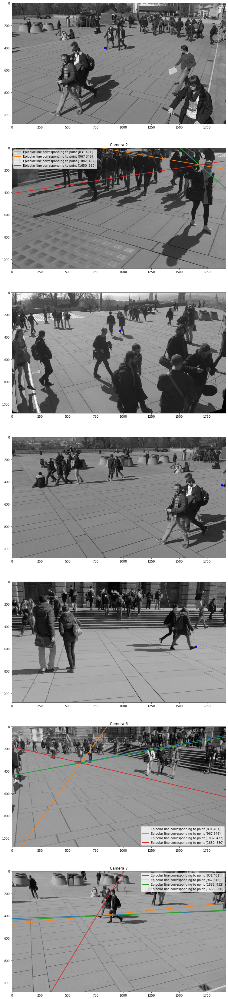

In [15]:
def task4(cameraList, pixelList):
  ''' Read in the images '''
  base_images = []
  for i in cameraList:
    base_image1 = io.imread(path + '/C{:1d}/00000015.png'.format(i))
    base_image1 = cv2.cvtColor(base_image1, cv2.COLOR_BGR2RGB)
    base_image1 = cv2.cvtColor(base_image1, cv2.COLOR_BGR2GRAY)
    base_images.append(base_image1)


  fig, ax = plt.subplots(7, 1)
  fig.set_size_inches(20, 60)
  for i in range(7) :
      if i+1 in cameraList:
        continue
      file_name = path + '/C{:1d}/00000015.png'.format(i+1)
      image = io.imread(file_name)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

      E = []
      F = []
      R = []
      T = []
      K_left = []

      # calculate the fundamental matrices and get the intrinsic parameters
      for j in cameraList:
        E1, F1, R1, T1 = compute_essential_fundamental_matrices (R_list[j-1], T_list[j-1], K_list[j-1], R_list[i], T_list[i], K_list[i])
        K1 = K_list[j-i]
        E.append(E1)
        F.append(F1)
        R.append(R1)
        T.append(T1)
        K_left.append(K1)
     
    
      K_right = K_list[i]

      #----------------------------------Display-------------------------------------------------------
       
      
      p1 = [np.array(l) for l in pixelList]

      epiX = []
      epiY = []
    
      for k in range(len(cameraList)):
        ax[i].set_title('Camera {}'.format(i+1))
        ax[cameraList[k]-1].imshow(base_images[k], 'gray')
        ax[cameraList[k]-1].plot(p1[k][0], p1[k][1], 'bo')
        x_11, y_11, x_21, y_21 = epipolar_lines (F[k], p1[k][:,None], base_images[k].shape, image.shape)
        ax[i].plot(x_21, y_21, linewidth=2, label = 'Epipolar line corresponding to point {}'.format(p1[k]))
        epiX.append(x_21)
        epiY.append(y_21)
      
      ax[i].imshow(image, 'gray')
      ax[i].legend()



c = [1,3,4,5]
p = [[831,401], [967,346], [1882,432], [1650,580]]
p2 = [[831,402], [967,347], [1881,432], [1651,580]]
p3 = [[830,401], [966,346], [1883,432], [1651,580]]
p4 = [[831,400], [967,345], [1882,432], [1650,581]]
task4(c, p)

# To plot using some variation in pixel locations uncomment these lines
# task4(c, p2)
# task4(c, p3)
# task4(c, p4)

## Task 5

Heights estimated using 3*3 neighborhood:  [166.4365661844584, 167.16419348088917, 167.89223273173616, 165.75055364678659, 166.47778349708892, 167.20543034300263, 165.06482970449144, 165.79165684707175, 166.51890611018877]
3D shoe tip location using the given point locations:  166.47778349708892  cm
Mean of heights: 166.47801694952375 cm
STD of heights: 0.8165480278683623 cm
Max height: 167.89223273173616 cm
Min height: 165.06482970449144 cm




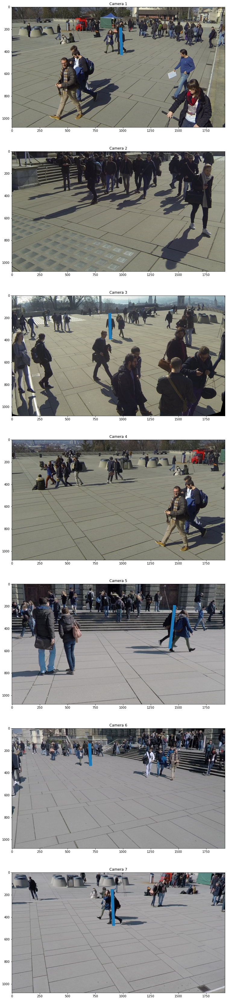

In [16]:
def estimate_3D_pt_3D_residual (pts, K, R, T) :
    ''' K, R, T: lists of size N of intrinsic and extrinsic parameters of the cameras.  
        pts: 2 by N point locations on image 
        returns 3 by 1 location of the 3D point.'''
    N = pts.shape[1]
    denominator = np.zeros((3,3))
    numerator = np.zeros((3,1))
    v = np.ones((3,1))
    for j in range (N) : 
        v[0] = pts[0,j]; v[1] = pts[1,j];
        v_hat = np.linalg.inv(K[j] @ R[j]) @ v
        v_hat = v_hat / np.linalg.norm(v_hat, axis=0)
        #print('v_hat', v_hat)
        c_j = - np.transpose(R[j]) @ T[j]
        #print('c_j', c_j)
        denominator += (np.eye(3) - v_hat @ np.transpose(v_hat))
        numerator += (np.eye(3) - v_hat @ np.transpose(v_hat)) @ c_j

    p = np.linalg.inv(denominator) @ numerator
    return(p)
top = [[978, 196],[0,0], [881,169],[0,0], [1464, 202], [699, 148], [902,162]]
bottom = [[988,416], [0,0],[886, 380],[0,0], [1423, 565] , [708, 324],[915,465]]


def task5(top, bottom):
  fig, ax = plt.subplots(7, 1)
  fig.set_size_inches(20, 60)
  images = []
  top = [np.array(i) for i in top]
  bottom = [np.array(i) for i in bottom]
  top_variations = []
  bottom_variations = []

  #Take all the pixels in the 3*3 neighborhood into consideration for height estimation
  for i in [-1,0,1]:
    for j in [-1,0,1]:
      t1 = [k+i for k in top]
      b1 = [k+j for k in bottom]
      top_variations.append(t1)
      bottom_variations.append(b1)


  # Estimate 3D points using selected cameras
  selected_list = [0,2, 4, 5,6]
  K_list_selected = [K_list[i] for i in selected_list]
  R_list_selected = [R_list[i] for i in selected_list]
  T_list_selected = [T_list[i][:,None] for i in selected_list]

  top_3D = estimate_3D_pt_3D_residual (np.transpose(top)[:,selected_list], 
                                            K_list_selected, R_list_selected, T_list_selected)
  bottom_3D = estimate_3D_pt_3D_residual (np.transpose(bottom)[:,selected_list], 
                                            K_list_selected, R_list_selected, T_list_selected)
  heights = []
  for a in range(len(top_variations)):
    top1_3D = estimate_3D_pt_3D_residual (np.transpose(top_variations[a])[:,selected_list], 
                                              K_list_selected, R_list_selected, T_list_selected)
    bottom1_3D = estimate_3D_pt_3D_residual (np.transpose(bottom_variations[a])[:,selected_list], 
                                              K_list_selected, R_list_selected, T_list_selected)
    distance1 = np.sqrt((np.square(top1_3D - bottom1_3D)).sum())
    heights.append(distance1)
  
  distance = np.sqrt((np.square(top_3D - bottom_3D)).sum())
  x = np.array(heights)
  
  print('Heights estimated using 3*3 neighborhood: ', heights)
  print('3D shoe tip location using the given point locations: ', distance, ' cm')
  print('Mean of heights: {} cm\nSTD of heights: {} cm\nMax height: {} cm\nMin height: {} cm\n\n'.format(np.mean(x), np.std(x), np.max(x), np.min(x)))

  
  #Diplay the points selected 
  for i in range(7) :
    file_name = path + '/C{:1d}/00000015.png'.format(i+1)
    image = io.imread(file_name)
    images.append(image)
    ax[i].set_title('Camera {}'.format(i+1))
    ax[i].imshow(images[i], 'gray')
    if (i in selected_list): #images selected to create the estimate
        x_values = [top[i][0], bottom[i][0]]
        y_values = [top[i][1], bottom[i][1]]
        ax[i].plot(x_values, y_values, ls='-', linewidth=10) 
      
    


task5(top, bottom)


  